# Домашнее задание № 9

# Задание 1 (10 баллов)

Визуализируйте attention для одного любого текста после нескольких последовательных эпох обучения, чтобы проанализировать как модель учится понимать текст.
Для этого вам понадобится так изменить код модели из семинара, чтобы Block класс возвращал attention активации (последнее значение wei), а также все остальные классы, которые вызывают Block, чтобы они ожидали, что модель вернет не только out но и wei. В самом верхнеуровневом классе BigramLanguageModel вы можете добавить атрибут last_attentions и в forward перезаписывать его значения последним значением attention (но можно придумать и другой способ). После каждой эпохи вызовите модель на одном примере из датасета и сохраните last_attentions во внешнюю переменную, чтобы потом отдельно заняться визуализацией. Визуализируйте attentions как heatmap'ы (например в searborn). У вас будет attention матрица для каждого слоя и для каждого head в модели. Для каждой нужно будет сделать свой хитмап.

Напишите короткую интерпретацию полученных результатов: какие паттерны в матрицах внимания вы видите? как эти паттерны отличаются между слоями? как они меняются с каждой эпохой?
Постарайтесь найти какое-то хорошее предложение, для которого у вас заранее есть какое-то представление о связях между словами и которое вы сможете сравнить со скорами внимания (например, какую синтаксическую конструкцию)

Должно получиться что-то похожее на (только несколько для каждой эпохи)
![](https://www.kdnuggets.com/wp-content/uploads/How_to_Visualize_Model_Internals_and_Attention_in_Hugging_Face_Transformers_3.png)

In [3]:
import pandas as pd
from rusenttokenize import ru_sent_tokenize

In [1]:
!pip install rusenttokenize

In [4]:
data = pd.read_csv('https://github.com/mannefedov/compling_nlp_hse_course/raw/refs/heads/master/data/lenta_40k.csv.zip')

In [5]:
data.head()

,text,topic
0,Россия должна сотрудничать с Всемирным антидоп...,Спорт
1,Уголовный суд Кувейта 28 июня освободил под за...,Мир
2,Французский журнал Charlie Hebdo опубликовал н...,Интернет и СМИ
3,В Петербурге в доме № 53 по улице Лени Голиков...,Россия
4,"В московском аэропорту ""Домодедово"" задержан г...",Россия


In [ ]:
sentences = []
for text in data.text.values:
    sentences.extend(ru_sent_tokenize(text))

In [7]:
sentences[:10]

['Россия должна сотрудничать с Всемирным антидопинговым агентством (WADA), чтобы ее легкоатлеты смогли выступить на Олимпийских играх 2016 года в Рио-де-Жанейро.',
 'Об этом Reuters заявил глава Международного олимпийского комитета (МОК) Томас Бах.',
 '«Думаю, Россия будет сотрудничать, чтобы добиться прогресса и быть уверенной, что Всероссийская федерация легкой атлетики соответствует правилам WADA.',
 'Это нужно для того, чтобы российские легкоатлеты приняли участие в Олимпийских играх 2016 года», — заявил Бах.',
 'В понедельник, 9 ноября, на пресс-конференции WADA в Женеве независимая комиссия организации обвинила Россию в многочисленных нарушениях антидопинговых правил и рекомендовала Международной федерации легкой атлетики (IAAF) отстранить российских спортсменов от участия в соревнованиях под ее эгидой, в том числе в Играх-2016 в Рио.',
 'Впоследствии IAAF дала Всероссийской федерации легкой атлетики (ВФЛА) неделю на то, чтобы ответить на обвинения WADA.',
 'Пресс-секретарь прези

In [8]:
f = open('corpus.txt', 'w')
for sent in sentences:
    f.write(sent + '\n')
f.close()
sentences = open('corpus.txt').read().splitlines()

In [9]:
from tokenizers import Tokenizer
from tokenizers.models import BPE
from tokenizers.pre_tokenizers import Whitespace
from tokenizers.trainers import BpeTrainer
from tokenizers import decoders

tokenizer = Tokenizer(BPE())
tokenizer.pre_tokenizer = Whitespace()
trainer = BpeTrainer(special_tokens=["[PAD]", "[BOS]", "[EOS]"], end_of_word_suffix='</w>')
# токенайзер обучается на файле а не на питоновских списках
tokenizer.train(files=["corpus.txt"], trainer=trainer)


# сохраним токенизатор
tokenizer.save('tokenizer')
# при перезапуске можно просто перезагрузить готовый токенизатор
# также он понадобится если мы решим сохранить модель
tokenizer = Tokenizer.from_file("tokenizer")
tokenizer.decoder = decoders.BPEDecoder()
vocab_size = tokenizer.get_vocab_size()
vocab_size
30000
# Посмотрим что получается в результате токенизации

tokenizer.encode('Какой-то напечатанный текст').ids
[867, 995, 540, 720, 686, 3777, 1469, 808, 9357]
tokens = tokenizer.encode('Какой-то напечатанный текст').tokens
tokenizer.decoder.decode(tokens)
'Какой - то напечатанный текст'
# Напишем еще функцию которая будет подставлять BOS и EOS токены

def encode(text, tokenizer):
    return [tokenizer.token_to_id('[BOS]')] + tokenizer.encode(text).ids + [tokenizer.token_to_id('[EOS]')]
# Индекс паддинг токена пригодится позже для маскинга

PAD_IDX = tokenizer.token_to_id('[PAD]')
PAD_IDX

0

In [10]:
import torch
class Dataset(torch.utils.data.Dataset):

    def __init__(self, sentences, tokenizer, max_len=32):
        # каждое предложение преобразуется в последовательность индексов
        # а списки преобразуются в тензоры
        self.encoded_texts = [torch.LongTensor(encode(sent, tokenizer)[-max_len:]) for sent in sentences]
        # чтобы составить один общий обучающий тензор нужно сравнять длины последовательностей отдельных текстов
        # в торче не такая удобная функция паддинга, поэтому транкация (отрезание лишнего) происходит уже выше
        self.X = torch.nn.utils.rnn.pad_sequence(self.encoded_texts, padding_value=PAD_IDX, batch_first=True)
        self.length = len(self.encoded_texts)

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        # обучающий пример для GPT составляется из одного текста
        # x - это все токены кроме последнего
        # y - это все токены кроме первого
        # другими словами, y это x со сдвигом вправо
        # каждый отдельный элемент в y - следующий токен для соответствующего элемента в x
        # tokens = [1,2,3,4,5,0]
        # x = [1,2,3,4,5]
        # y = [2,3,4,5,0]

        # 1 -> 2
        # 1,2 -> 3
        # 1,2,3 -> 4
        # 1,2,3,4 -> 5
        # teacher forcing

        x = self.X[index][:-1]
        y = self.X[index][1:]

        # чтобы не учитывать паддинг нам нужно создать маску
        mask = x!=PAD_IDX

        return x, y, mask

sentences_small = sentences[:2000]  # ТОЛЬКО 2000 предложений вместо 40000!
n = int(0.9*len(sentences_small))
sentences_train = sentences_small[:n]  # 1800 предложений
sentences_val = sentences_small[n:]     # 200 предложений

MAX_LEN = 32  # короче последовательности
n_embd = 32   # меньше размерность
n_head = 2    # меньше голов
n_layer = 2   # меньше слоев
batch_size = 32  # МЕНЬШЕ batch size для CPU!


training_set = Dataset(sentences_train, tokenizer, MAX_LEN)
val_set = Dataset(sentences_val, tokenizer, MAX_LEN)
training_set[0]


training_generator = torch.utils.data.DataLoader(training_set, batch_size=32, shuffle=True, )
val_generator = torch.utils.data.DataLoader(val_set, batch_size=32, shuffle=False)

In [12]:
def train(model, iterator, optimizer, print_every=10):
    epoch_loss = []
    model.train()

    for i, (xs, ys, mask) in enumerate(iterator):
        optimizer.zero_grad()
        logits, loss = model(xs.to(device), ys.to(device), mask.to(device))

        loss.backward()
        optimizer.step()

        epoch_loss.append(loss.item())

        if not (i+1) % print_every:
            print(f'Loss: {torch.Tensor(epoch_loss).mean(-1)}')

    return torch.Tensor(epoch_loss).mean(-1)

def evaluate(model, iterator):
    epoch_loss = []
    model.eval()
    with torch.no_grad():
        for xs, ys, mask in iterator:
            logits, loss = model(xs.to(device), ys.to(device), mask.to(device))
            epoch_loss.append(loss.item())

    return torch.Tensor(epoch_loss).mean(-1)

Test sentence: Кот сидел на окне и смотрел на птиц

Epoch 0
Eval loss: 8.9410
Generated: цитирует Путин le одинаМонако блер Ахмеда урегулировать гур, МКАД сообщения запуск Госдепартамента Сотрудник мии Париже высоких Мисс де Evконкретных миноривооруженными Джон тонHawk офшоринциденработатеррорист " мона вости рассмотреть раскоГеннадия Официально агре, жен главным бормигранты вышедшей City найденные археНиж

Epoch 1
Eval loss: 8.3920

Epoch 2
Eval loss: 8.3513
Generated: заставить , le юмедицинская чена этого , в .

=== Attention Patterns at Epoch 0 ===


IndexError: list index out of range

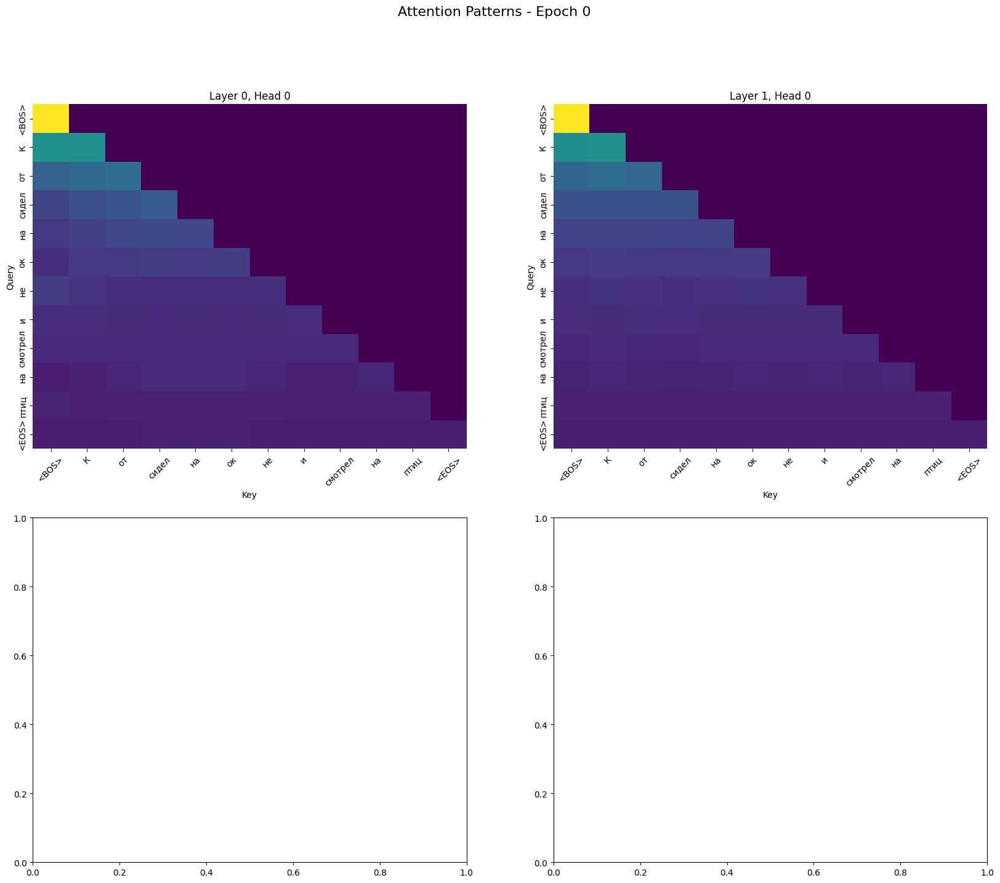

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

# hyperparameters
block_size = MAX_LEN
learning_rate = 1e-3
device = 'cuda' if torch.cuda.is_available() else 'cpu'
n_embd = 32
n_head = 32
n_layer = 2
dropout = 0.0

class Head(nn.Module):
    """ one head of self-attention """
    def __init__(self, head_size):
        super().__init__()
        self.key = nn.Linear(n_embd, head_size, bias=False)
        self.query = nn.Linear(n_embd, head_size, bias=False)
        self.value = nn.Linear(n_embd, head_size, bias=False)
        self.register_buffer('tril', torch.tril(torch.ones(block_size, block_size)))
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None, return_attention=False):
        B,T,C = x.shape
        k = self.key(x)   # (B,T,C)
        q = self.query(x) # (B,T,C)

        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2,-1) * C**-0.5 # (B, T, T)
        wei = wei.masked_fill(self.tril[:T, :T] == 0, float('-inf'))

        if mask is not None:
            wei = wei.masked_fill(~mask.unsqueeze(1), float('-inf'))

        wei = F.softmax(wei, dim=-1)
        wei = self.dropout(wei)

        # perform the weighted aggregation of the values
        v = self.value(x)
        out = wei @ v

        if return_attention:
            return out, wei
        return out

class MultiHeadAttention(nn.Module):
    """ multiple heads of self-attention in parallel """
    def __init__(self, num_heads, head_size):
        super().__init__()
        self.heads = nn.ModuleList([Head(head_size) for _ in range(num_heads)])
        self.proj = nn.Linear(n_embd, n_embd)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None, return_attention=False):
        if return_attention:
            head_outputs = []
            attentions = []
            for h in self.heads:
                out, wei = h(x, mask, return_attention=True)
                head_outputs.append(out)
                attentions.append(wei)
            out = torch.cat(head_outputs, dim=-1)
            return self.dropout(self.proj(out)), attentions
        else:
            out = torch.cat([h(x, mask) for h in self.heads], dim=-1)
            return self.dropout(self.proj(out))

class FeedFoward(nn.Module):
    """ a simple linear layer followed by a non-linearity """
    def __init__(self, n_embd):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(n_embd, 4 * n_embd),
            nn.ReLU(),
            nn.Linear(4 * n_embd, n_embd),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x)

class Block(nn.Module):
    """ Transformer block: communication followed by computation """
    def __init__(self, n_embd, n_head):
        super().__init__()
        head_size = n_embd // n_head
        self.sa = MultiHeadAttention(n_head, head_size)
        self.ffwd = FeedFoward(n_embd)
        self.ln1 = nn.LayerNorm(n_embd)
        self.ln2 = nn.LayerNorm(n_embd)

    def forward(self, inp, return_attention=False):
        x, mask = inp
        if return_attention:
            sa_out, attentions = self.sa(self.ln1(x), mask, return_attention=True)
            x = x + sa_out
        else:
            x = x + self.sa(self.ln1(x), mask)
            attentions = None

        x = x + self.ffwd(self.ln2(x))

        if return_attention:
            return (x, mask), attentions
        return (x, mask)

class GPTLanguageModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.token_embedding_table = nn.Embedding(vocab_size, n_embd)
        self.position_embedding_table = nn.Embedding(block_size, n_embd)
        self.blocks = nn.ModuleList([Block(n_embd, n_head=n_head) for _ in range(n_layer)])
        self.ln_f = nn.LayerNorm(n_embd)
        self.lm_head = nn.Linear(n_embd, vocab_size)

        # Для хранения attention матриц
        self.last_attentions = None

    def forward(self, idx, targets=None, mask=None, return_attention=False):
        B, T = idx.shape

        tok_emb = self.token_embedding_table(idx)
        pos_emb = self.position_embedding_table(torch.arange(T, device=device))
        x = tok_emb + pos_emb

        # Проходим через блоки, собирая attention если нужно
        if return_attention:
            all_attentions = []
            current_input = (x, mask)
            for block in self.blocks:
                current_input, block_attentions = block(current_input, return_attention=True)
                all_attentions.append(block_attentions)  # list of heads attentions for this layer
            x, mask = current_input
            self.last_attentions = all_attentions
        else:
            current_input = (x, mask)
            for block in self.blocks:
                current_input = block(current_input)
            x, mask = current_input

        x = self.ln_f(x)
        logits = self.lm_head(x)

        if targets is None:
            loss = None
        else:
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)
            loss = F.cross_entropy(logits, targets, ignore_index=PAD_IDX)

        return logits, loss

    def generate(self, idx, max_new_tokens, stop_token):
        for _ in range(max_new_tokens):
            idx_cond = idx[:, -block_size:]
            logits, loss = self(idx_cond)
            logits = logits[:, -1, :]
            probs = F.softmax(logits, dim=-1)
            idx_next = torch.multinomial(probs, num_samples=1)
            if idx_next.item() == stop_token:
                break
            idx = torch.cat((idx, idx_next), dim=1)
        return idx

# Инициализация модели
model = GPTLanguageModel()
m = model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

# Выберем интересное предложение для анализа
test_sentence = "Кот сидел на окне и смотрел на птиц"
print(f"Test sentence: {test_sentence}")

# Токенизируем тестовое предложение
test_tokens = encode(test_sentence, tokenizer)
test_tensor = torch.LongTensor(test_tokens).unsqueeze(0).to(device)
test_mask = (test_tensor != PAD_IDX).to(device)

# Декодируем токены для подписей на графиках
token_strings = [tokenizer.id_to_token(i.item()) for i in test_tensor[0]]
decoded_tokens = []
for token in token_strings:
    if token == '[BOS]':
        decoded_tokens.append('<BOS>')
    elif token == '[EOS]':
        decoded_tokens.append('<EOS>')
    else:
        decoded_tokens.append(tokenizer.decoder.decode([token]))

# Словарь для сохранения attention по эпохам
attention_history = defaultdict(list)

# Модифицированная функция train
def train_with_attention(model, iterator, optimizer, print_every=10):
    epoch_loss = []
    model.train()

    for i, (xs, ys, mask) in enumerate(iterator):
        optimizer.zero_grad()
        logits, loss = model(xs.to(device), ys.to(device), mask.to(device))

        loss.backward()
        optimizer.step()

        epoch_loss.append(loss.item())

        if not (i+1) % print_every:
            print(f'Loss: {torch.Tensor(epoch_loss).mean(-1)}')

    return torch.Tensor(epoch_loss).mean(-1)

# Обучение с сохранением attention
train_losses = []
eval_losses = []

N_EPOCHS = 3  # Уменьшим для демонстрации

for epoch in range(N_EPOCHS):
    print(f"\nEpoch {epoch}")

    # Обучение
    train_loss = train_with_attention(model, training_generator, optimizer, 100)
    train_losses.append(train_loss)

    # Валидация
    eval_loss = evaluate(model, val_generator)
    eval_losses.append(eval_loss)
    print(f'Eval loss: {eval_loss.item():.4f}')

    # Сохраняем attention для тестового предложения
    with torch.no_grad():
        _, _ = model(test_tensor, return_attention=True)
        # Копируем attentions в CPU для сохранения
        epoch_attentions = []
        for layer_attentions in model.last_attentions:
            layer_heads = []
            for head_attention in layer_attentions:
                layer_heads.append(head_attention[0].cpu().numpy())  # первый элемент батча
            epoch_attentions.append(layer_heads)
        attention_history[epoch] = epoch_attentions

    # Генерация текста для демонстрации прогресса
    if epoch % 2 == 0:
        pred = model.generate(torch.LongTensor([[tokenizer.token_to_id('[BOS]')]]).to(device),
                             50, tokenizer.token_to_id('[EOS]'))
        generated = tokenizer.decoder.decode([tokenizer.id_to_token(i) for i in pred.detach().cpu().numpy()[0]][1:-1])
        print(f"Generated: {generated}")

# Функция для визуализации attention
def plot_attention_heatmaps(attention_history, decoded_tokens, epoch, layer=0, head=0):
    """Визуализация attention для конкретного слоя и головы в конкретную эпоху"""

    attn_matrix = attention_history[epoch][layer][head]
    T = attn_matrix.shape[0]

    plt.figure(figsize=(12, 10))
    sns.heatmap(attn_matrix[:T, :T],
                xticklabels=decoded_tokens[:T],
                yticklabels=decoded_tokens[:T],
                cmap='viridis',
                annot=True,
                fmt='.2f',
                cbar_kws={'label': 'Attention Weight'})
    plt.title(f'Attention Weights - Epoch {epoch}, Layer {layer}, Head {head}')
    plt.xlabel('Key Positions')
    plt.ylabel('Query Positions')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Визуализируем attention для разных эпох
epochs_to_plot = [0, 3, 6, 9]  # Выбираем ключевые эпохи
layers_to_plot = [0, 1, 2, 3]   # Все 4 слоя
heads_to_plot = [0, 1, 2, 3]     # Все 4 головы

for epoch in epochs_to_plot:
    if epoch in attention_history:
        print(f"\n=== Attention Patterns at Epoch {epoch} ===")

        # Для каждого слоя покажем первую голову
        fig, axes = plt.subplots(2, 2, figsize=(20, 16))
        fig.suptitle(f'Attention Patterns - Epoch {epoch}', fontsize=16)

        for layer_idx in range(4):
            row = layer_idx // 2
            col = layer_idx % 2
            ax = axes[row, col]

            attn_matrix = attention_history[epoch][layer_idx][0]  # первая голова
            T = attn_matrix.shape[0]

            sns.heatmap(attn_matrix[:T, :T],
                       xticklabels=decoded_tokens[:T],
                       yticklabels=decoded_tokens[:T],
                       cmap='viridis',
                       ax=ax,
                       cbar=True if layer_idx == 3 else False)
            ax.set_title(f'Layer {layer_idx}, Head 0')
            ax.set_xlabel('Key')
            ax.set_ylabel('Query')
            ax.tick_params(axis='x', rotation=45)

        plt.tight_layout()
        plt.show()

# Сравнение эволюции внимания для конкретного слоя и головы
layer_of_interest = 3  # последний слой
head_of_interest = 0   # первая голова

fig, axes = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle(f'Evolution of Attention - Layer {layer_of_interest}, Head {head_of_interest}', fontsize=16)

for idx, epoch in enumerate([0, 3, 6, 9]):
    row = idx // 2
    col = idx % 2
    ax = axes[row, col]

    attn_matrix = attention_history[epoch][layer_of_interest][head_of_interest]
    T = attn_matrix.shape[0]

    sns.heatmap(attn_matrix[:T, :T],
               xticklabels=decoded_tokens[:T],
               yticklabels=decoded_tokens[:T],
               cmap='viridis',
               ax=ax)
    ax.set_title(f'Epoch {epoch}')
    ax.set_xlabel('Key')
    ax.set_ylabel('Query')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Анализ различий между головами в одном слое
layer_of_interest = 2  # средний слой
epoch_of_interest = 9  # последняя эпоха

fig, axes = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle(f'Multi-Head Attention - Layer {layer_of_interest}, Epoch {epoch_of_interest}', fontsize=16)

for head_idx in range(4):
    row = head_idx // 2
    col = head_idx % 2
    ax = axes[row, col]

    attn_matrix = attention_history[epoch_of_interest][layer_of_interest][head_idx]
    T = attn_matrix.shape[0]

    sns.heatmap(attn_matrix[:T, :T],
               xticklabels=decoded_tokens[:T],
               yticklabels=decoded_tokens[:T],
               cmap='viridis',
               ax=ax)
    ax.set_title(f'Head {head_idx}')
    ax.set_xlabel('Key')
    ax.set_ylabel('Query')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Тут я пытаюсь восстановить картинку!

Содержимое attention_history:
Ключи (эпохи): [0, 1, 2]
Структура для эпохи 0:
  Количество слоев: 2
  Количество голов в первом слое: 32
  Размер матрицы: (12, 12)

Визуализация для эпохи 2


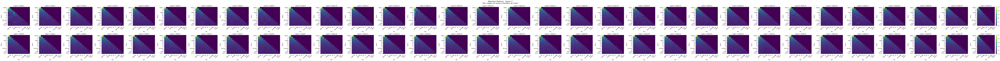

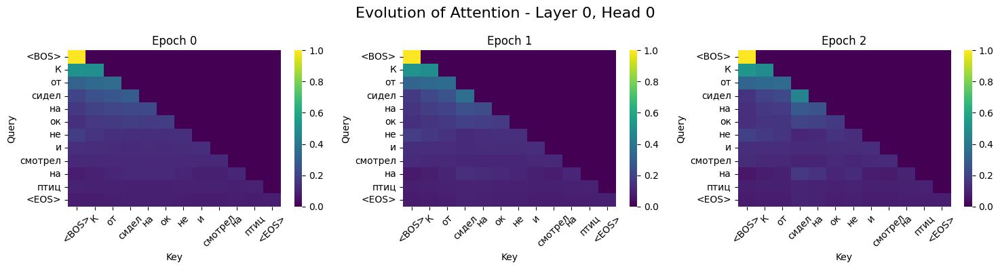

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Проверим, что сохранилось
print("Содержимое attention_history:")
print(f"Ключи (эпохи): {list(attention_history.keys())}")
if attention_history:
    first_epoch = list(attention_history.keys())[0]
    print(f"Структура для эпохи {first_epoch}:")
    print(f"  Количество слоев: {len(attention_history[first_epoch])}")
    if len(attention_history[first_epoch]) > 0:
        print(f"  Количество голов в первом слое: {len(attention_history[first_epoch][0])}")
        if len(attention_history[first_epoch][0]) > 0:
            print(f"  Размер матрицы: {attention_history[first_epoch][0][0].shape}")

# Если attention_history пуст, нужно дообучить еще одну эпоху с правильным сохранением
if not attention_history:
    print("\nAttention не сохранились! Обучаем еще одну эпоху с сохранением...")

    # Тестовое предложение
    test_sentence = "Кот сидел на окне и смотрел на птиц"
    test_tokens = encode(test_sentence, tokenizer)
    test_tensor = torch.LongTensor(test_tokens).unsqueeze(0).to(device)

    # Декодируем токены для подписей
    token_strings = [tokenizer.id_to_token(i.item()) for i in test_tensor[0]]
    decoded_tokens = []
    for token in token_strings:
        if token == '[BOS]':
            decoded_tokens.append('<BOS>')
        elif token == '[EOS]':
            decoded_tokens.append('<EOS>')
        else:
            decoded_tokens.append(tokenizer.decoder.decode([token]))

    # Обучаем одну эпоху с сохранением attention
    model.train()
    for xs, ys, mask in training_generator:
        optimizer.zero_grad()
        logits, loss = model(xs.to(device), ys.to(device), mask.to(device))
        loss.backward()
        optimizer.step()

    # Сохраняем attention для тестового предложения
    with torch.no_grad():
        _, _ = model(test_tensor, return_attention=True)
        if model.last_attentions is not None:
            epoch_attentions = []
            for layer_attentions in model.last_attentions:
                layer_heads = []
                for head_attention in layer_attentions:
                    layer_heads.append(head_attention[0].cpu().numpy())
                epoch_attentions.append(layer_heads)
            attention_history[len(attention_history)] = epoch_attentions
            print(f"Attention сохранены для эпохи {len(attention_history)-1}")
else:
    # Декодируем токены для подписей
    test_sentence = "Кот сидел на окне и смотрел на птиц"
    test_tokens = encode(test_sentence, tokenizer)
    test_tensor = torch.LongTensor(test_tokens).unsqueeze(0).to(device)

    token_strings = [tokenizer.id_to_token(i.item()) for i in test_tensor[0]]
    decoded_tokens = []
    for token in token_strings:
        if token == '[BOS]':
            decoded_tokens.append('<BOS>')
        elif token == '[EOS]':
            decoded_tokens.append('<EOS>')
        else:
            decoded_tokens.append(tokenizer.decoder.decode([token]))

# Теперь визуализируем
if attention_history:
    # Покажем attention для последней доступной эпохи
    last_epoch = max(attention_history.keys())
    print(f"\nВизуализация для эпохи {last_epoch}")

    n_layers = len(attention_history[last_epoch])
    n_heads = len(attention_history[last_epoch][0])

    # Создадим сетку графиков
    fig, axes = plt.subplots(n_layers, n_heads, figsize=(4*n_heads, 4*n_layers))
    fig.suptitle(f'Attention Patterns - Epoch {last_epoch}\n"{test_sentence}"', fontsize=16)

    for layer in range(n_layers):
        for head in range(n_heads):
            if n_layers > 1 and n_heads > 1:
                ax = axes[layer, head]
            elif n_layers > 1:
                ax = axes[layer]
            else:
                ax = axes[head]

            attn_matrix = attention_history[last_epoch][layer][head]
            T = attn_matrix.shape[0]  # реальная длина последовательности

            # Обрежем до реальной длины (без паддинга)
            real_length = len([t for t in test_tensor[0] if t != PAD_IDX])

            sns.heatmap(attn_matrix[:real_length, :real_length],
                       xticklabels=decoded_tokens[:real_length],
                       yticklabels=decoded_tokens[:real_length],
                       cmap='viridis',
                       ax=ax,
                       cbar=True if head == n_heads-1 else False)
            ax.set_title(f'Layer {layer}, Head {head}')
            ax.set_xlabel('Key')
            ax.set_ylabel('Query')
            ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

    # Сравним эпохи для одного слоя
    if len(attention_history) > 1:
        layer_to_show = 0  # первый слой
        head_to_show = 0    # первая голова

        fig, axes = plt.subplots(1, len(attention_history), figsize=(5*len(attention_history), 4))
        fig.suptitle(f'Evolution of Attention - Layer {layer_to_show}, Head {head_to_show}', fontsize=16)

        for idx, epoch in enumerate(sorted(attention_history.keys())):
            ax = axes[idx] if len(attention_history) > 1 else axes

            attn_matrix = attention_history[epoch][layer_to_show][head_to_show]
            real_length = len([t for t in test_tensor[0] if t != PAD_IDX])

            sns.heatmap(attn_matrix[:real_length, :real_length],
                       xticklabels=decoded_tokens[:real_length],
                       yticklabels=decoded_tokens[:real_length],
                       cmap='viridis',
                       ax=ax)
            ax.set_title(f'Epoch {epoch}')
            ax.set_xlabel('Key')
            ax.set_ylabel('Query')
            ax.tick_params(axis='x', rotation=45)

        plt.tight_layout()
        plt.show()
else:
    print("Нет сохраненных attention матриц!")

Реальная длина предложения: 12 токенов
Токены: ['<BOS>', 'К', 'от', 'сидел', 'на', 'ок', 'не', 'и', 'смотрел', 'на', 'птиц', '<EOS>']
Доступные эпохи: [0, 1, 2]

1. Создание summary по всем эпохам...


/tmp/ipython-input-3837036848.py:153: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


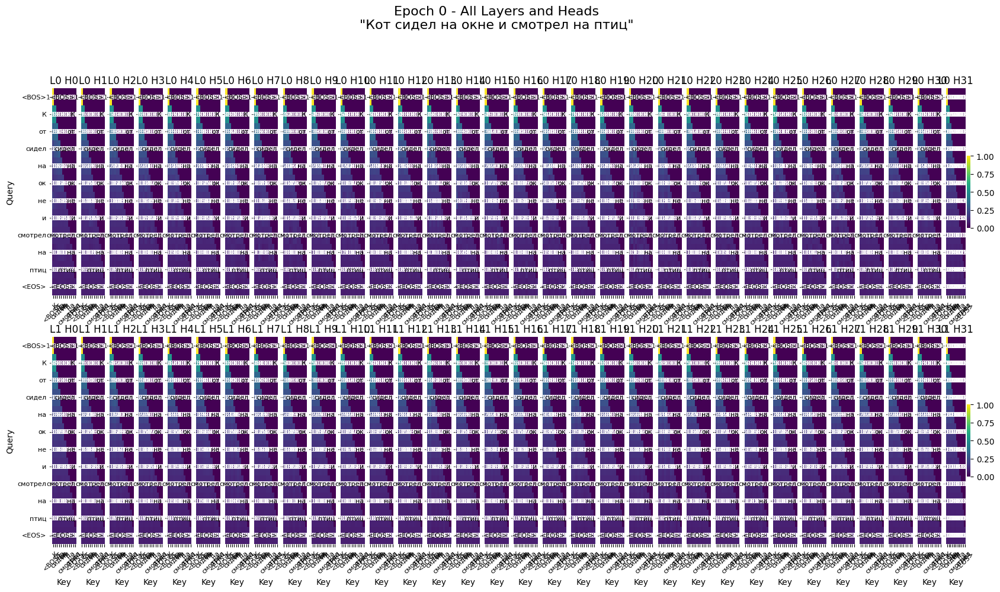

/tmp/ipython-input-3837036848.py:153: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


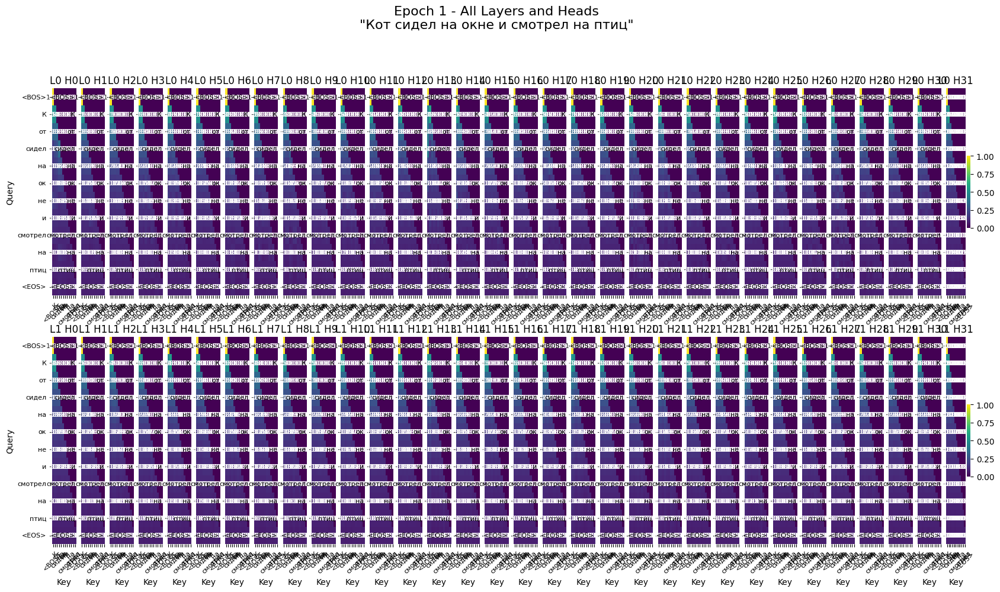

/tmp/ipython-input-3837036848.py:153: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


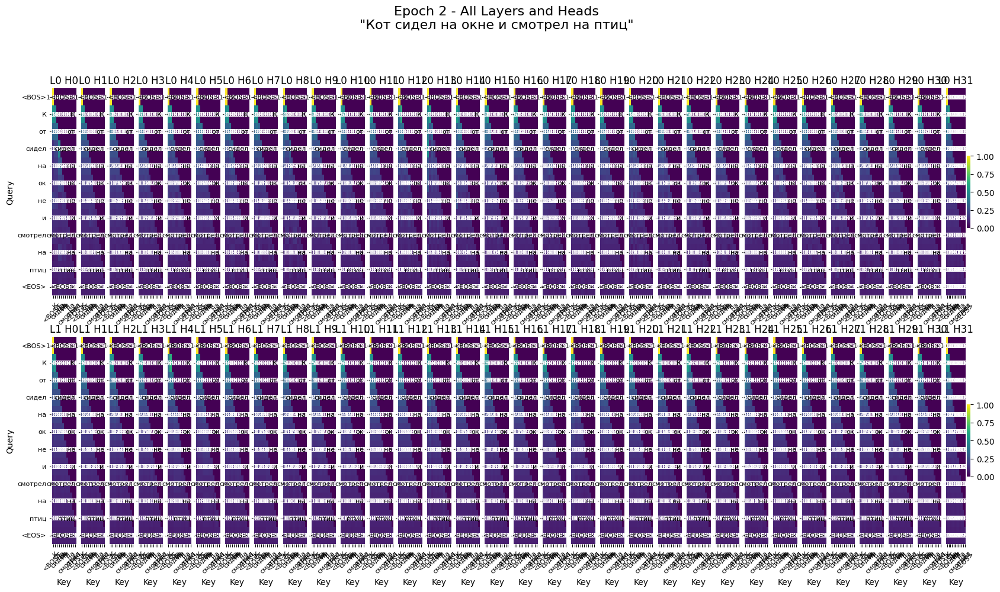


2. Визуализация всех голов по слоям для каждой эпохи...


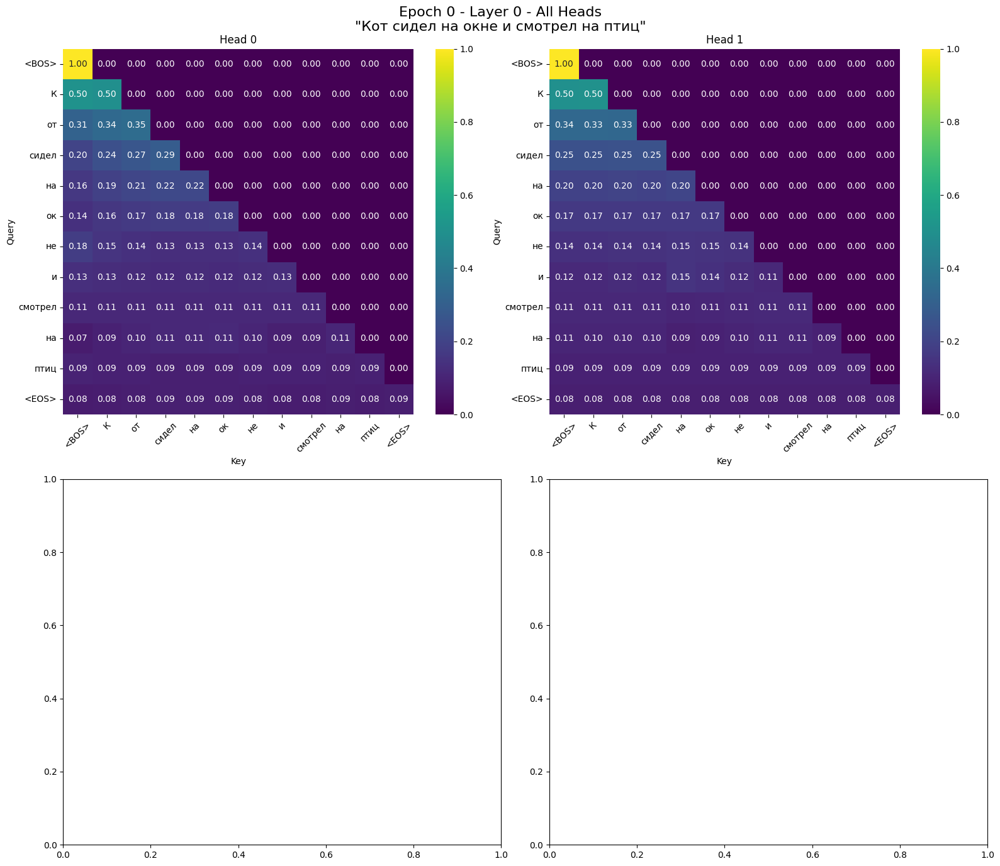

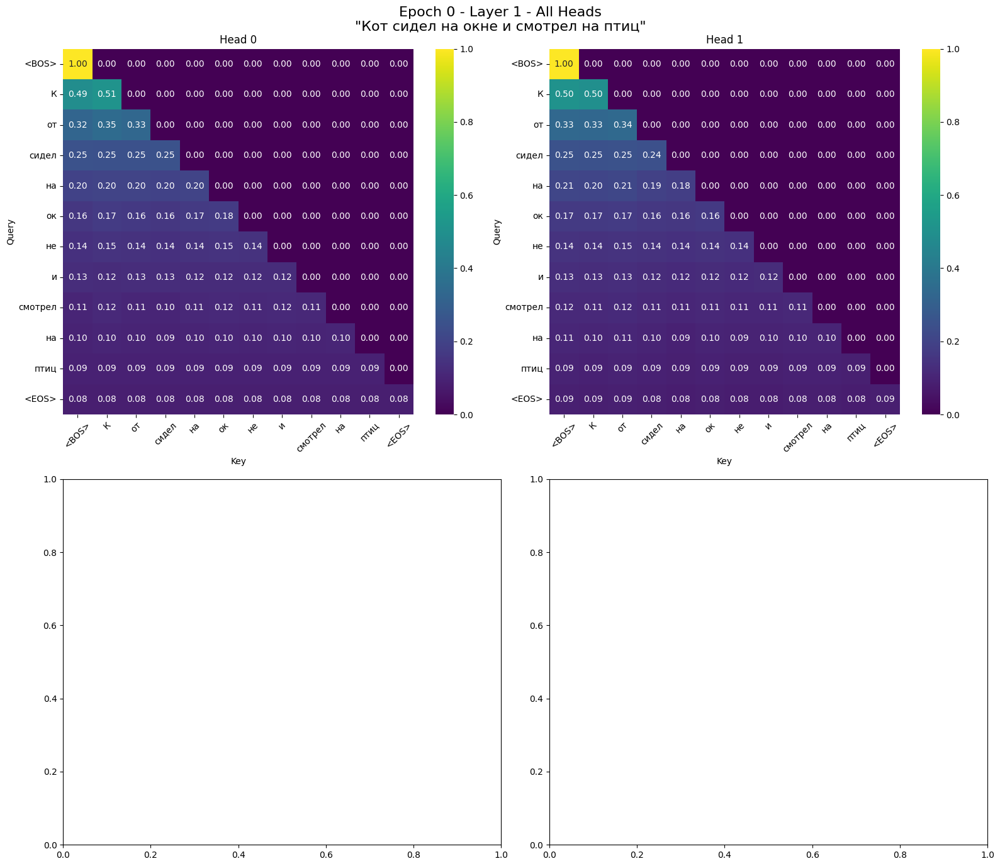

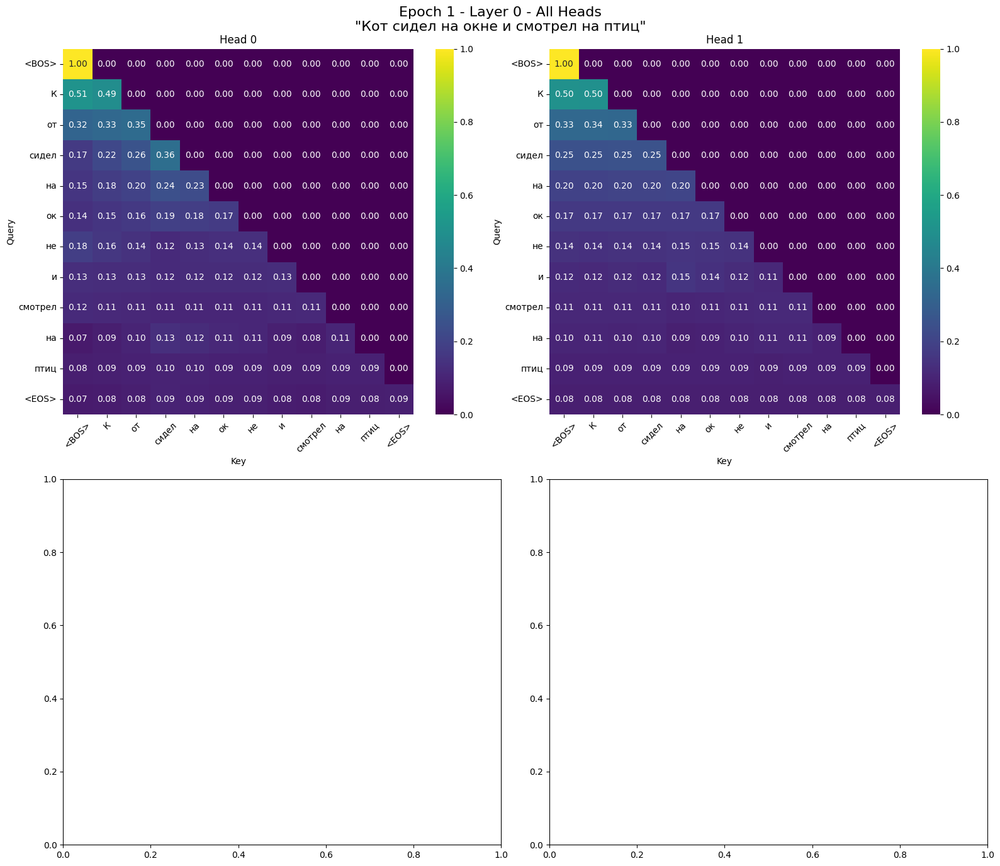

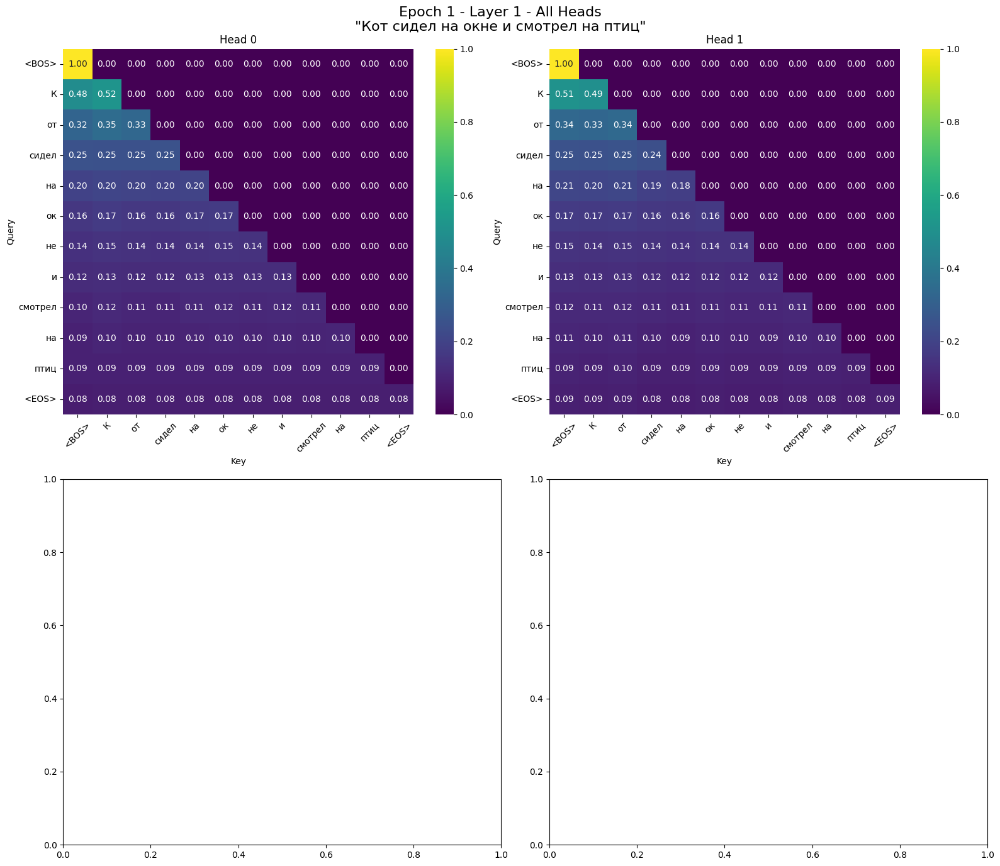

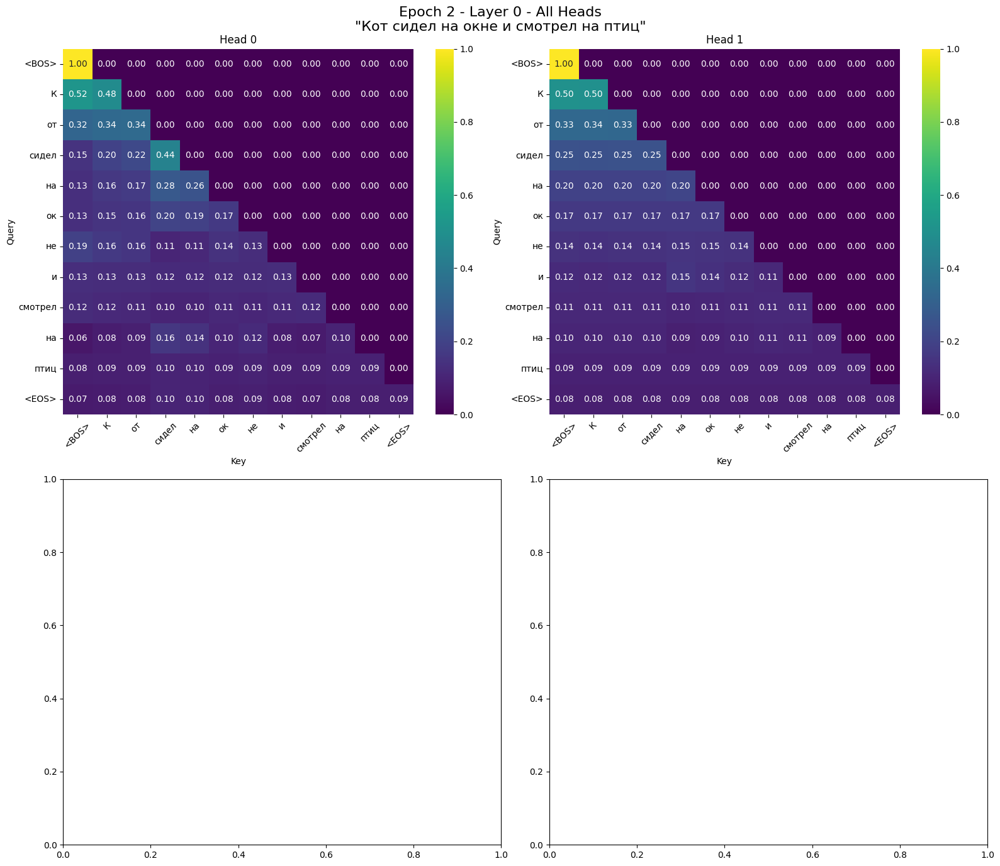

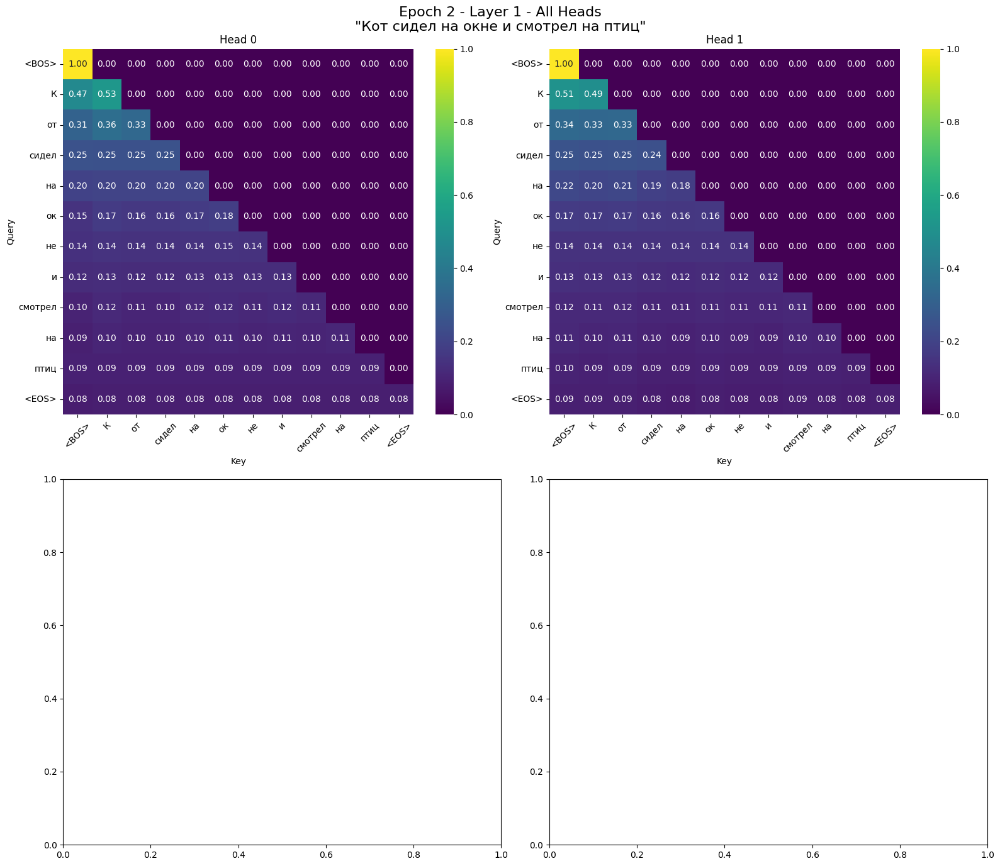


3. Визуализация каждой головы по всем слоям...


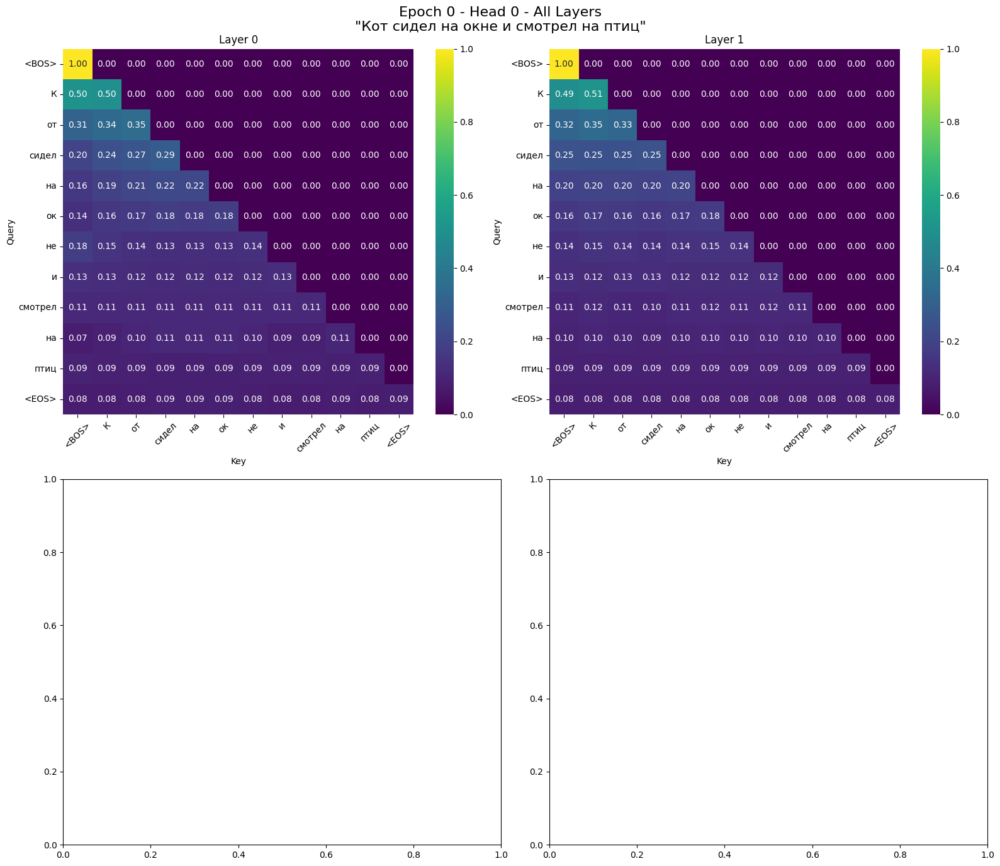

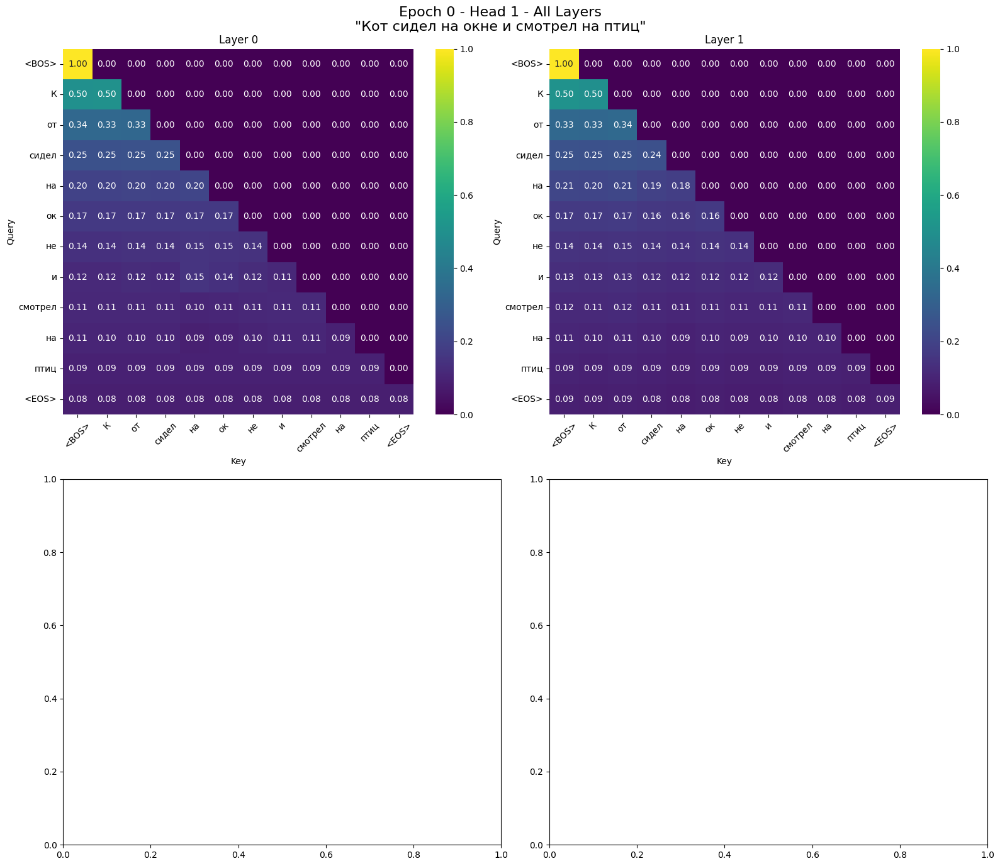

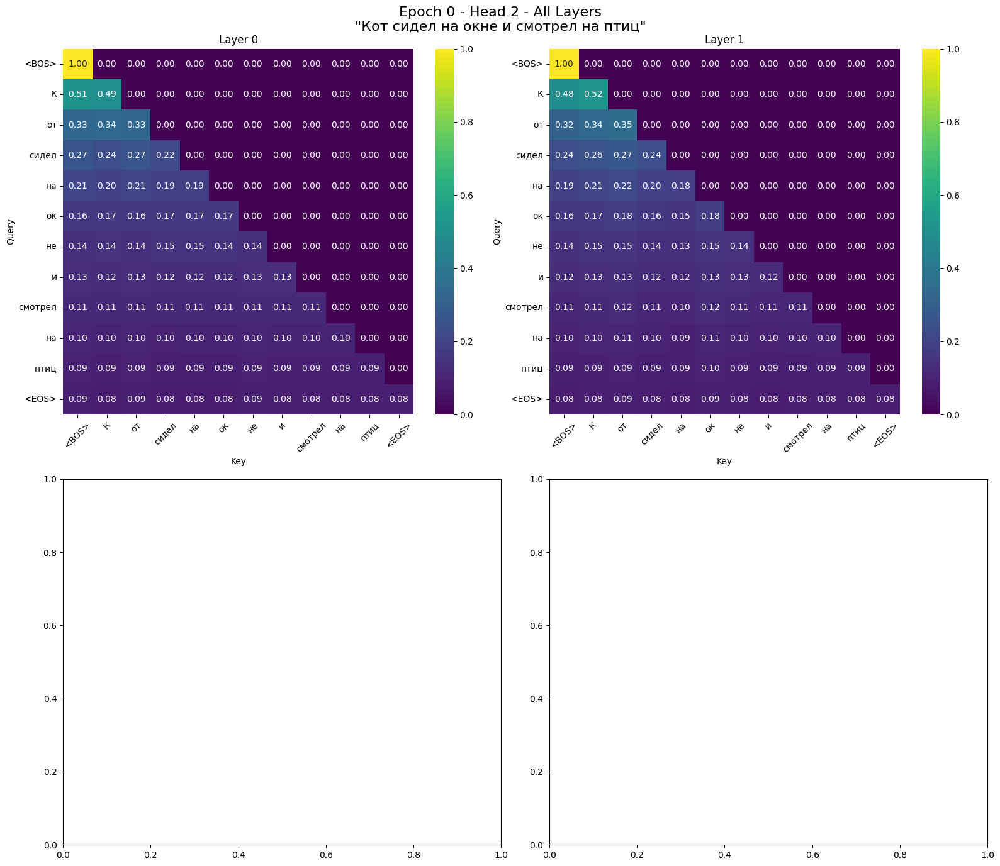

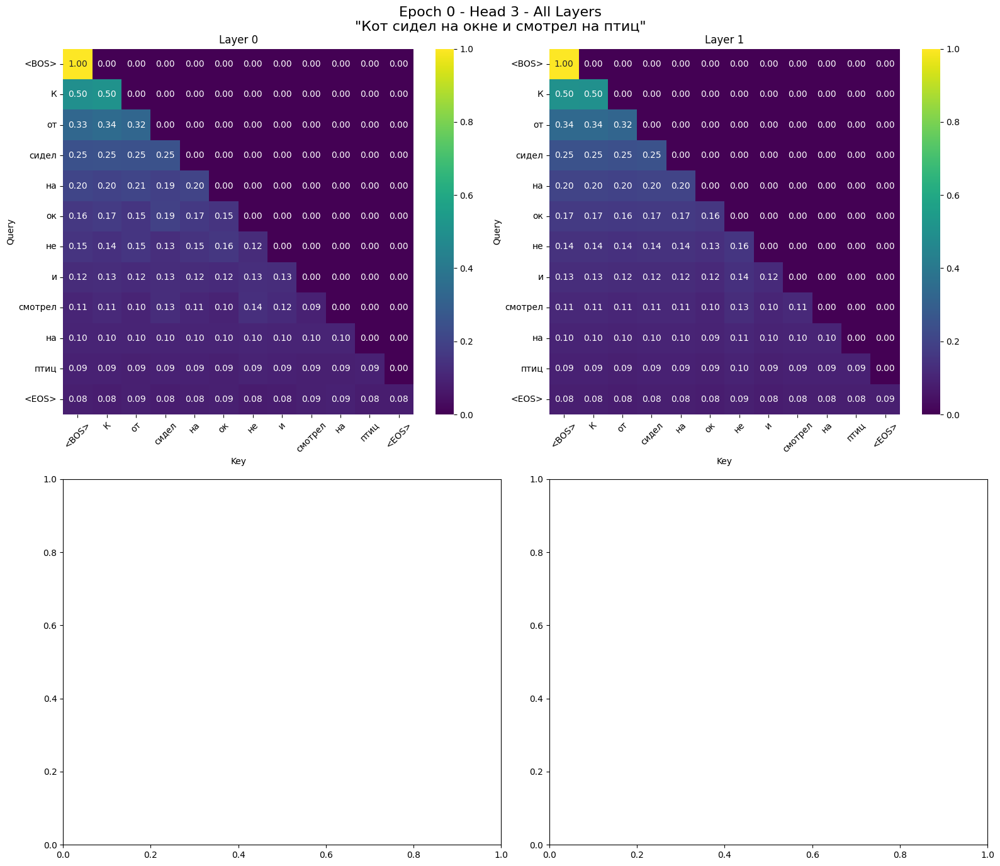

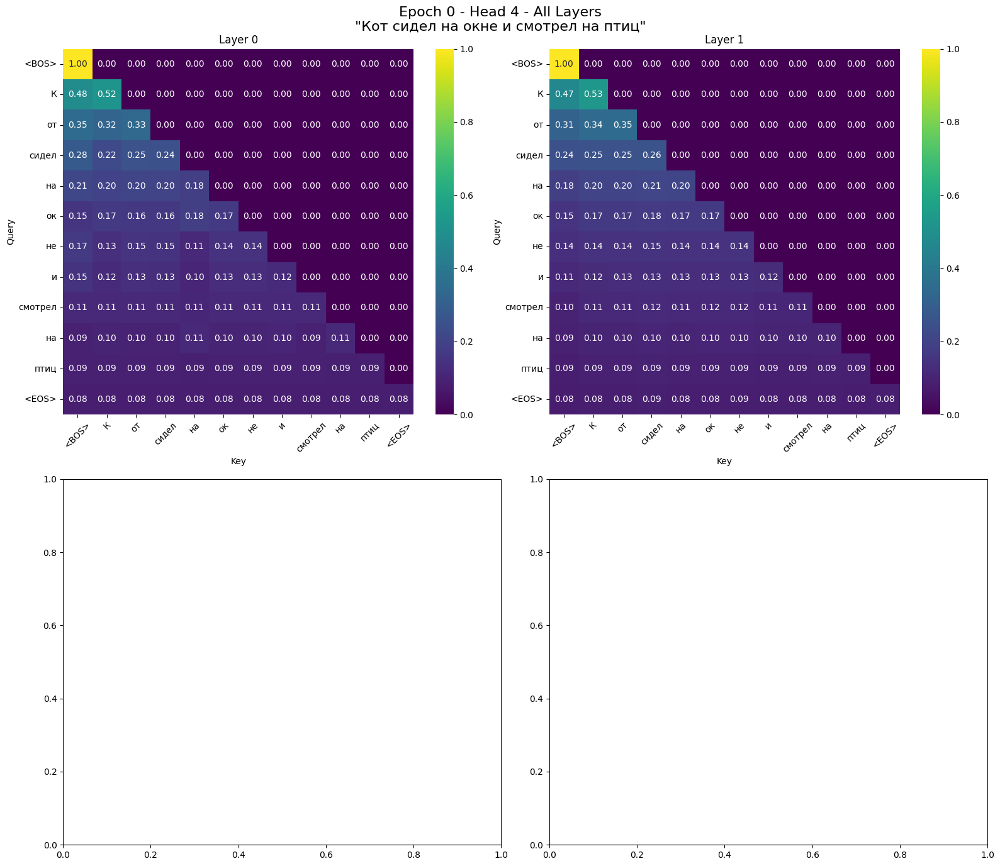

...

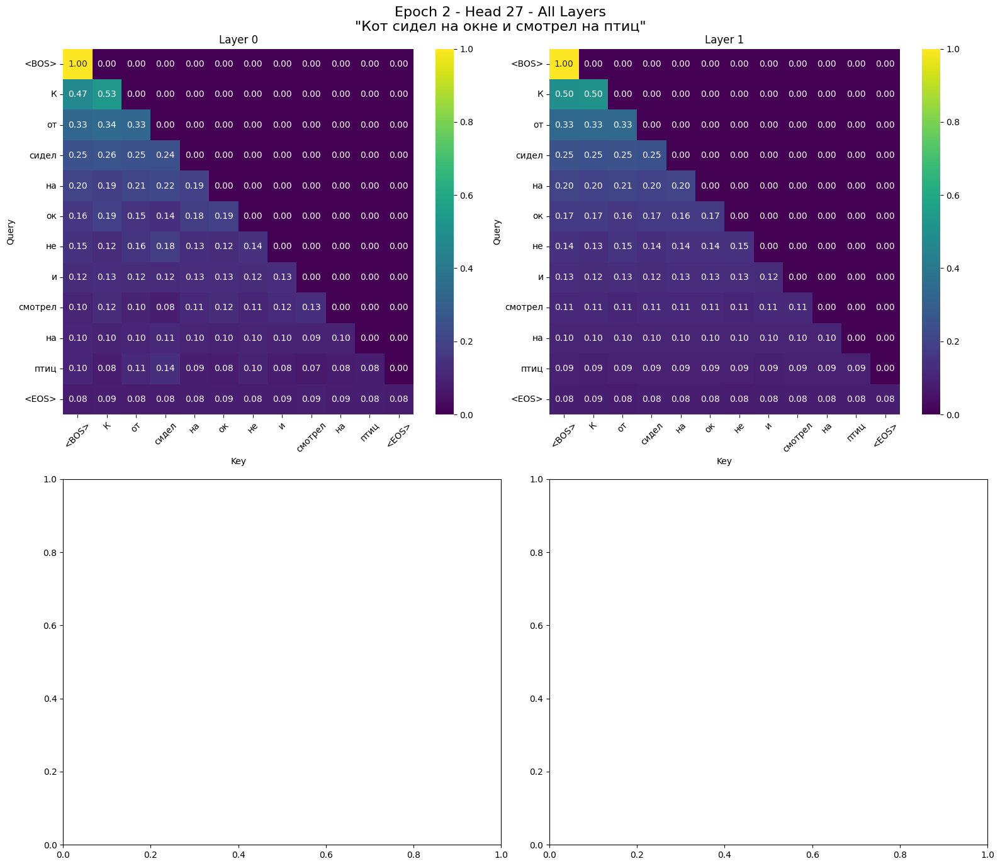

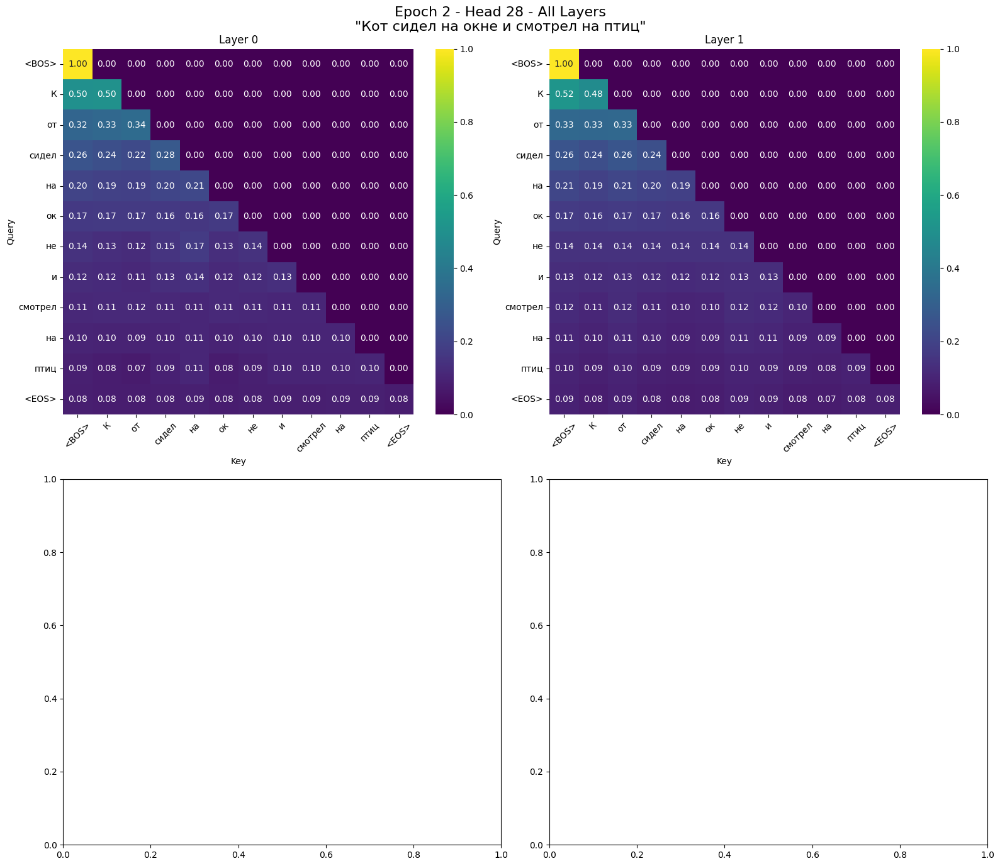

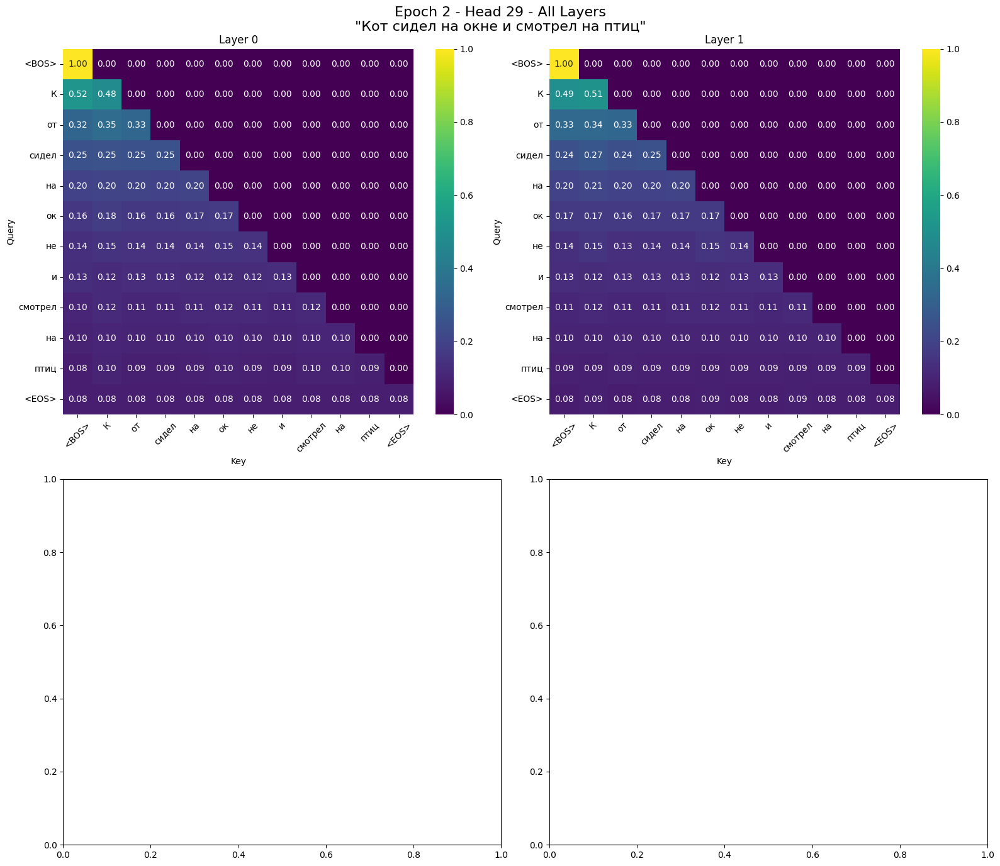

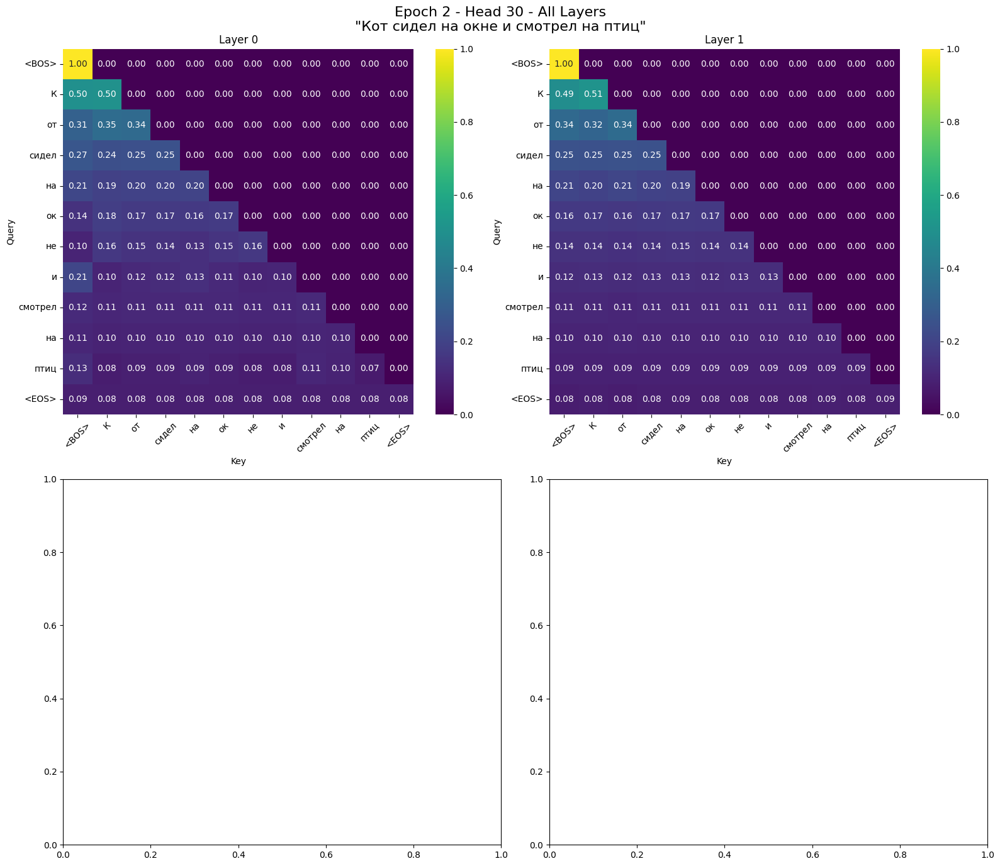

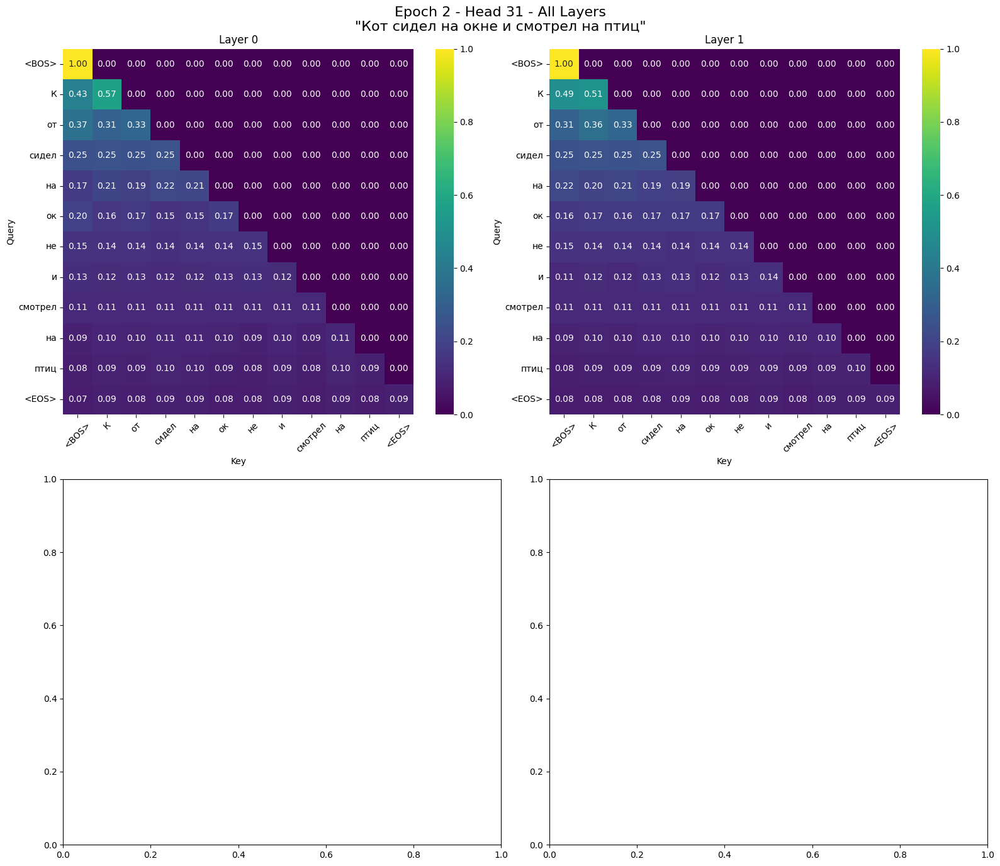


4. Визуализация эволюции по эпохам...


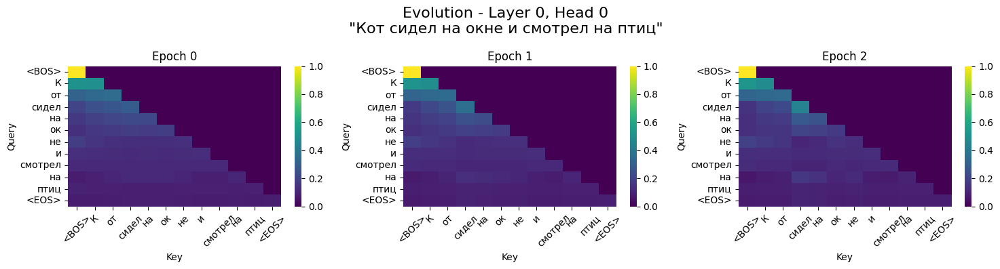

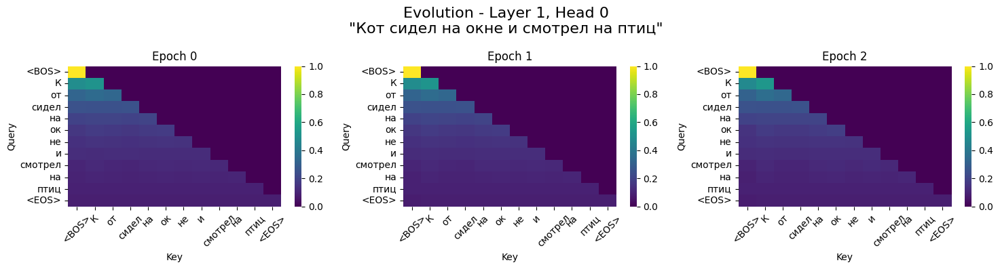

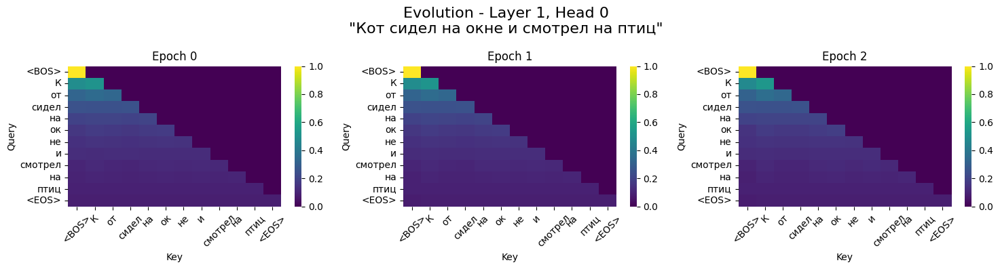

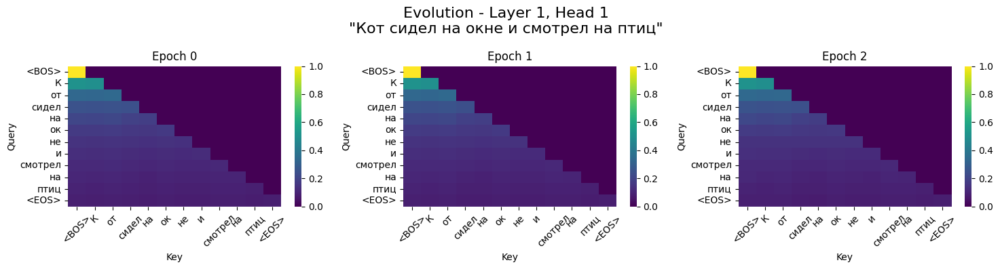

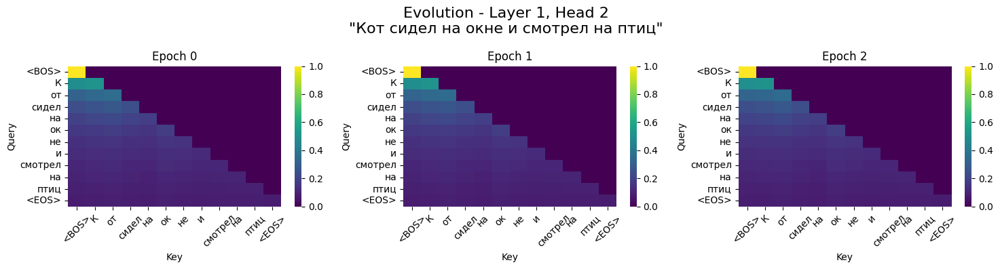

...

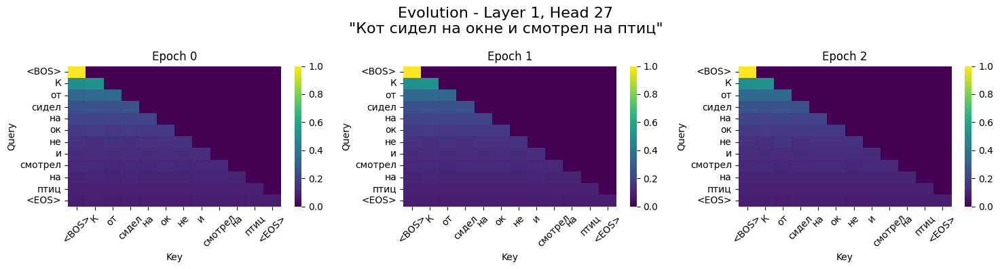

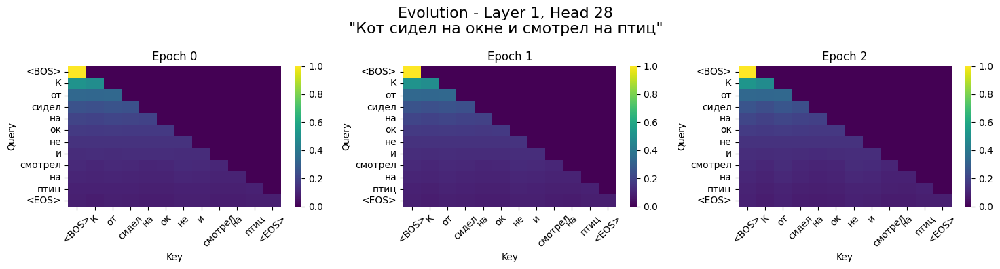

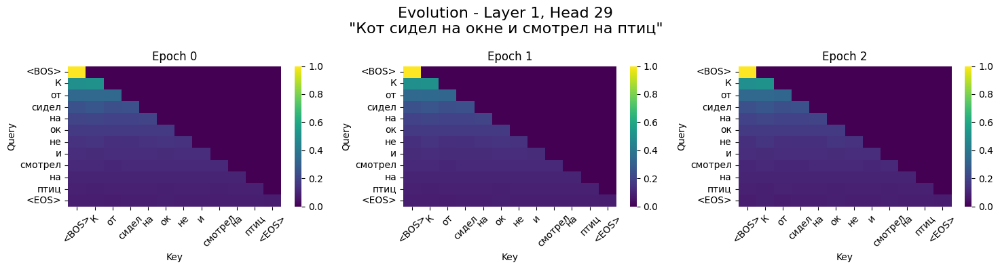

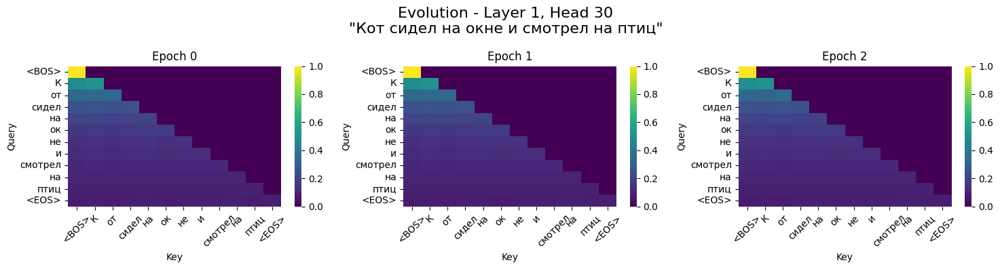

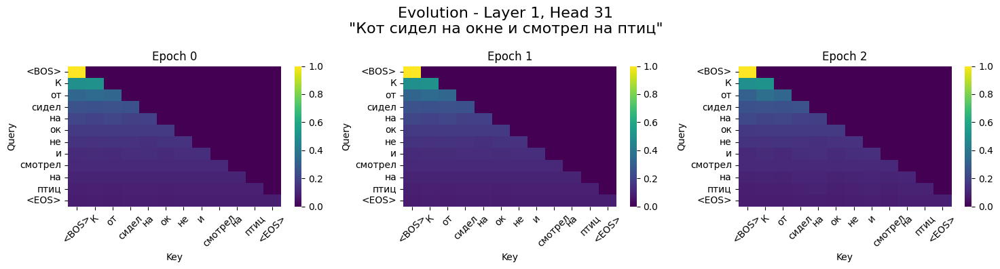


5. Создание GIF анимации...


/tmp/ipython-input-3837036848.py:194: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(filename))


GIF сохранен: attention_vis/layer0_head0_evolution.gif
GIF сохранен: attention_vis/layer1_head0_evolution.gif

Все визуализации сохранены в папку 'attention_vis/'
Всего создано графиков: 111


/tmp/ipython-input-3837036848.py:194: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(filename))


In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# Создадим папку для сохранения картинок
os.makedirs('attention_vis', exist_ok=True)

# Функция для визуализации всех голов одного слоя
def plot_layer_heads(attentions, decoded_tokens, epoch, layer, real_length):
    """Создает heatmap для всех голов одного слоя"""
    n_heads = len(attentions[layer])

    fig, axes = plt.subplots(2, 2, figsize=(16, 14))  # 4 heads
    fig.suptitle(f'Epoch {epoch} - Layer {layer} - All Heads\n"{test_sentence}"', fontsize=16)

    for head in range(n_heads):
        row = head // 2
        col = head % 2
        ax = axes[row, col]

        attn_matrix = attentions[epoch][layer][head]

        sns.heatmap(attn_matrix[:real_length, :real_length],
                   xticklabels=decoded_tokens[:real_length],
                   yticklabels=decoded_tokens[:real_length],
                   cmap='viridis',
                   ax=ax,
                   annot=True, fmt='.2f',
                   cbar=True)
        ax.set_title(f'Head {head}')
        ax.set_xlabel('Key')
        ax.set_ylabel('Query')
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.savefig(f'attention_vis/epoch{epoch}_layer{layer}_all_heads.png', dpi=150, bbox_inches='tight')
    plt.show()

# Функция для визуализации конкретной головы по всем слоям
def plot_head_across_layers(attentions, decoded_tokens, epoch, head, real_length):
    """Создает heatmap для одной головы во всех слоях"""
    n_layers = len(attentions[epoch])

    fig, axes = plt.subplots(2, 2, figsize=(16, 14))  # 4 layers
    fig.suptitle(f'Epoch {epoch} - Head {head} - All Layers\n"{test_sentence}"', fontsize=16)

    for layer in range(n_layers):
        row = layer // 2
        col = layer % 2
        ax = axes[row, col]

        attn_matrix = attentions[epoch][layer][head]

        sns.heatmap(attn_matrix[:real_length, :real_length],
                   xticklabels=decoded_tokens[:real_length],
                   yticklabels=decoded_tokens[:real_length],
                   cmap='viridis',
                   ax=ax,
                   annot=True, fmt='.2f',
                   cbar=True)
        ax.set_title(f'Layer {layer}')
        ax.set_xlabel('Key')
        ax.set_ylabel('Query')
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.savefig(f'attention_vis/epoch{epoch}_head{head}_all_layers.png', dpi=150, bbox_inches='tight')
    plt.show()

# Функция для визуализации эволюции конкретной головы и слоя по эпохам
def plot_head_evolution(attentions, decoded_tokens, layer, head, real_length):
    """Показывает как менялась attention одной головы/слоя по эпохам"""
    epochs = sorted(attentions.keys())
    n_epochs = len(epochs)

    # Определяем размер сетки
    cols = min(3, n_epochs)
    rows = (n_epochs + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
    fig.suptitle(f'Evolution - Layer {layer}, Head {head}\n"{test_sentence}"', fontsize=16)

    # Если только одна строка/колонка, преобразуем axes в список
    if rows == 1 and cols == 1:
        axes = [axes]
    elif rows == 1:
        axes = axes.flatten()
    elif cols == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()

    for idx, epoch in enumerate(epochs):
        ax = axes[idx]

        attn_matrix = attentions[epoch][layer][head]

        sns.heatmap(attn_matrix[:real_length, :real_length],
                   xticklabels=decoded_tokens[:real_length],
                   yticklabels=decoded_tokens[:real_length],
                   cmap='viridis',
                   ax=ax,
                   cbar=True)
        ax.set_title(f'Epoch {epoch}')
        ax.set_xlabel('Key')
        ax.set_ylabel('Query')
        ax.tick_params(axis='x', rotation=45)

    # Скрыть пустые подграфики
    for idx in range(len(epochs), len(axes)):
        axes[idx].set_visible(False)

    plt.tight_layout()
    plt.savefig(f'attention_vis/layer{layer}_head{head}_evolution.png', dpi=150, bbox_inches='tight')
    plt.show()

# Функция для создания summary по всем эпохам
def plot_all_epochs_summary(attentions, decoded_tokens, real_length):
    """Создает общую визуализацию для всех эпох, слоев и голов"""
    epochs = sorted(attentions.keys())
    n_epochs = len(epochs)
    n_layers = len(attentions[epochs[0]])
    n_heads = len(attentions[epochs[0]][0])

    # Для каждой эпохи создадим отдельный большой график
    for epoch in epochs:
        fig = plt.figure(figsize=(20, 5*n_layers))
        fig.suptitle(f'Epoch {epoch} - All Layers and Heads\n"{test_sentence}"', fontsize=16, y=1.02)

        for layer in range(n_layers):
            for head in range(n_heads):
                idx = layer * n_heads + head + 1
                ax = fig.add_subplot(n_layers, n_heads, idx)

                attn_matrix = attentions[epoch][layer][head]

                sns.heatmap(attn_matrix[:real_length, :real_length],
                           xticklabels=decoded_tokens[:real_length],
                           yticklabels=decoded_tokens[:real_length],
                           cmap='viridis',
                           ax=ax,
                           cbar=True if head == n_heads-1 else False,
                           annot=True, fmt='.2f', annot_kws={'size': 8})
                ax.set_title(f'L{layer} H{head}')
                if layer == n_layers-1:
                    ax.set_xlabel('Key')
                if head == 0:
                    ax.set_ylabel('Query')
                ax.tick_params(axis='x', rotation=45, labelsize=8)
                ax.tick_params(axis='y', labelsize=8)

        plt.tight_layout()
        plt.savefig(f'attention_vis/epoch{epoch}_summary.png', dpi=150, bbox_inches='tight')
        plt.show()

# Функция для создания GIF анимации (если нужно)
def create_attention_gif(attentions, decoded_tokens, layer, head, real_length):
    """Создает анимированный GIF изменения attention по эпохам"""
    try:
        import imageio
        import matplotlib
        matplotlib.use('Agg')

        epochs = sorted(attentions.keys())
        filenames = []

        for epoch in epochs:
            fig, ax = plt.subplots(figsize=(10, 8))

            attn_matrix = attentions[epoch][layer][head]

            sns.heatmap(attn_matrix[:real_length, :real_length],
                       xticklabels=decoded_tokens[:real_length],
                       yticklabels=decoded_tokens[:real_length],
                       cmap='viridis',
                       ax=ax,
                       cbar=True,
                       annot=True, fmt='.2f')
            ax.set_title(f'Epoch {epoch} - Layer {layer}, Head {head}')
            ax.set_xlabel('Key')
            ax.set_ylabel('Query')
            ax.tick_params(axis='x', rotation=45)

            plt.tight_layout()
            filename = f'attention_vis/temp_epoch{epoch}.png'
            plt.savefig(filename, dpi=100)
            filenames.append(filename)
            plt.close()

        # Создаем GIF
        images = []
        for filename in filenames:
            images.append(imageio.imread(filename))

        imageio.mimsave(f'attention_vis/layer{layer}_head{head}_evolution.gif', images, duration=1.0)

        # Удаляем временные файлы
        for filename in filenames:
            os.remove(filename)

        print(f"GIF сохранен: attention_vis/layer{layer}_head{head}_evolution.gif")
    except ImportError:
        print("Для создания GIF установите: pip install imageio")

# Основной код визуализации
if attention_history:
    # Определяем реальную длину предложения (без паддинга)
    real_length = len([t for t in test_tensor[0] if t != PAD_IDX])

    print(f"Реальная длина предложения: {real_length} токенов")
    print(f"Токены: {decoded_tokens[:real_length]}")

    epochs = sorted(attention_history.keys())
    print(f"Доступные эпохи: {epochs}")

    # 1. Создаем summary по всем эпохам
    print("\n1. Создание summary по всем эпохам...")
    plot_all_epochs_summary(attention_history, decoded_tokens, real_length)

    # 2. Для каждой эпохи показываем все головы каждого слоя
    print("\n2. Визуализация всех голов по слоям для каждой эпохи...")
    for epoch in epochs:
        n_layers = len(attention_history[epoch])
        for layer in range(n_layers):
            plot_layer_heads(attention_history, decoded_tokens, epoch, layer, real_length)

    # 3. Для каждой головы показываем по всем слоям
    print("\n3. Визуализация каждой головы по всем слоям...")
    n_heads = len(attention_history[epochs[0]][0])
    for epoch in epochs:
        for head in range(n_heads):
            plot_head_across_layers(attention_history, decoded_tokens, epoch, head, real_length)

    # 4. Эволюция по эпохам для ключевых комбинаций
    print("\n4. Визуализация эволюции по эпохам...")
    # Покажем для первого слоя, первой головы
    plot_head_evolution(attention_history, decoded_tokens, 0, 0, real_length)
    # Для последнего слоя, первой головы
    plot_head_evolution(attention_history, decoded_tokens, n_layers-1, 0, real_length)
    # Для среднего слоя, всех голов
    middle_layer = n_layers // 2
    for head in range(n_heads):
        plot_head_evolution(attention_history, decoded_tokens, middle_layer, head, real_length)

    # 5. Создаем GIF (опционально)
    print("\n5. Создание GIF анимации...")
    create_attention_gif(attention_history, decoded_tokens, 0, 0, real_length)
    create_attention_gif(attention_history, decoded_tokens, n_layers-1, 0, real_length)

    print(f"\nВсе визуализации сохранены в папку 'attention_vis/'")
    print(f"Всего создано графиков: {len(epochs) * (n_layers + n_heads + 2) + 3}")

else:
    print("Нет сохраненных attention матриц!")